In [1]:
%load_ext autoreload
%autoreload 2

In [41]:
import sys
from os.path import join
import torch
import matplotlib.pyplot as plt
sys.path.append("/n/netscratch/konkle_lab/Everyone/Jingxuan/DiffusionObjectRelation/PixArt-alpha")
from diffusion.utils.misc import read_config, set_random_seed, \
    init_random_seed, DebugUnderflowOverflow
sys.path.append("/n/netscratch/konkle_lab/Everyone/Jingxuan/DiffusionObjectRelation")
from utils.pixart_sampling_utils import visualize_prompts, PixArtAlphaPipeline_custom, \
    load_embed_and_mask#, visualize_prompts_with_traj
from utils.pixart_utils import construct_diffuser_pipeline_from_config, construct_pixart_transformer_from_config, state_dict_convert
from utils.attention_map_store_utils import replace_attn_processor, AttnProcessor2_0_Store, PixArtAttentionVisualizer_Store
import psutil
import time
import os
import numpy as np

### Load models and tokenizer

In [3]:
savedir = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/objrel_rndembdposemb_DiT_B_pilot"
ckptdir = join(savedir, "checkpoints")
config = read_config(join(savedir, 'config.py'))
#weight_dtype = torch.float32
config.mixed_precision = "bf16"
if config.mixed_precision == "fp16": # accelerator.
    weight_dtype = torch.float16
elif config.mixed_precision == "bf16": # accelerator.
    weight_dtype = torch.bfloat16
# fp16 will have overflow problem
# bf16 and float32 are good. 

In [4]:
#pipeline = construct_diffuser_pipeline_from_config(config, pipeline_class=PixArtAlphaPipeline_custom)
#ckpt = torch.load(join(ckptdir, "epoch_4000_step_160000.pth"))
#pipeline.transformer.load_state_dict(state_dict_convert(ckpt['state_dict_ema']))
#pipeline = pipeline.to("cuda")
#pipeline.set_progress_bar_config(disable=True)

In [5]:
validation_prompts = config.validation_prompts
prompt_cache_dir = config.prompt_cache_dir

In [6]:
#from transformers import T5Tokenizer, T5EncoderModel

#T5_path = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/output/pretrained_models/t5_ckpts/t5-v1_1-xxl"
#tokenizer = T5Tokenizer.from_pretrained(T5_path, )#subfolder="tokenizer")

### Load pretrained model

In [6]:
weight_dtype = torch.bfloat16 # torch.float32 

In [7]:
# Load the pretrained PixArt Alpha model from Hugging Face
model_name = "PixArt-alpha/PixArt-XL-2-512x512"
pipeline = PixArtAlphaPipeline_custom.from_pretrained(model_name,torch_dtype = weight_dtype)
pipeline = pipeline.to("cuda")
tokenizer = pipeline.tokenizer

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

Some weights of the model checkpoint were not used when initializing PixArtTransformer2DModel: 
 ['caption_projection.y_embedding']


### Systematic storing attention maps across time steps

In [7]:
from diffusers.models.attention_processor import AttnProcessor2_0
def restore_attn_processor(transformer):
    for layer in transformer.transformer_blocks:
        layer.attn1.processor = AttnProcessor2_0()
        layer.attn2.processor = AttnProcessor2_0()
    return transformer

In [8]:


def check_available_vram(stage):
    total_vram = torch.cuda.get_device_properties(0).total_memory / 1e9  # Total VRAM in GB
    allocated_vram = torch.cuda.memory_allocated(0) / 1e9  # Currently used VRAM in GB
    reserved_vram = torch.cuda.memory_reserved(0) / 1e9  # Reserved VRAM in GB
    free_vram = total_vram - reserved_vram  # Approximate free VRAM
    ram_usage = psutil.virtual_memory().used / 1e9  # Convert to GB

    print(f"{stage} Total VRAM: {total_vram:.2f} GB")
    print(f"{stage} Allocated VRAM: {allocated_vram:.2f} GB")
    print(f"{stage} Reserved VRAM: {reserved_vram:.2f} GB")
    print(f"{stage} Approximate Free VRAM: {free_vram:.2f} GB")
    print(f"{stage} RAM Usage:  {ram_usage:.2f} GB")

#check_available_vram()


def log_memory_usage(stage):
    """Logs VRAM and RAM usage at a given stage."""
    vram_alloc = torch.cuda.memory_allocated() / 1e9  # Convert to GB
    vram_reserved = torch.cuda.memory_reserved() / 1e9  # Convert to GB
    ram_usage = psutil.virtual_memory().used / 1e9  # Convert to GB
    
    print(f"[{stage}] VRAM Allocated: {vram_alloc:.2f} GB, VRAM Reserved: {vram_reserved:.2f} GB, RAM Usage: {ram_usage:.2f} GB")

@torch.inference_mode()
def visualize_prompts_with_traj(pipeline, validation_prompts, num_inference_steps=14, guidance_scale=4.5, 
                                num_images_per_prompt=1, device=torch.device("cuda"), random_seed=0, weight_dtype=torch.float16):

    # Move pipeline to GPU (or multi-GPU)
    pipeline.to(device)
    pipeline.set_progress_bar_config(disable=True)

    # Set up generator
    if random_seed is None:
        generator = None
    else:
        generator = torch.Generator(device=device).manual_seed(random_seed)
    #image_logs = []
    #print(generator.device.type)
    image_logs, images, latents, pred_traj, latents_traj, t_traj, visualized_prompts = [], [], [], [], [], [], []

    for prompt in validation_prompts:
        # Run pipeline
        output = pipeline(
            prompt=prompt,
            num_inference_steps=num_inference_steps,
            num_images_per_prompt=num_images_per_prompt,
            generator=generator,
            guidance_scale=guidance_scale,
            use_resolution_binning=False,
            return_sample_pred_traj=True,
            output_type="latent",
            device=device,
        )
        # Store latents and trajectories
        latents.append(output[0].images)
        pred_traj.append(output[1])
        latents_traj.append(output[2])
        t_traj.append(output[3])
        visualized_prompts.append(prompt)

    for latent in latents:
        images.append(pipeline.vae.decode(latent.to(weight_dtype) / pipeline.vae.config.scaling_factor, return_dict=False)[0])

    # Postprocess images (small VRAM impact)
    for prompt, image in zip(visualized_prompts, images):
        image = pipeline.image_processor.postprocess(image, output_type="pil")
        image_logs.append({"validation_prompt": prompt, "images": image})
    print("Function execution complete!")
    return image_logs, latents_traj, pred_traj, t_traj

def visualize_prompts_with_traj_profiling(*args, **kwargs):
    """Wrapper around the function to measure VRAM & RAM usage."""
    
    print("\n Starting function execution...")
    check_available_vram("Start")

    start_time = time.time()
    
    # Run function and measure memory at different points
    image_logs, latents_traj, pred_traj, t_traj = visualize_prompts_with_traj(*args, **kwargs)
    
    torch.cuda.synchronize()  # Ensure all GPU operations are done
    check_available_vram("After Function Execution")

    end_time = time.time()
    print(f"Total Execution Time: {end_time - start_time:.2f} sec")

    # Cleanup
    torch.cuda.empty_cache()
    torch.cuda.ipc_collect()
    check_available_vram("After Memory Cleanup")
    
    return image_logs, latents_traj, pred_traj, t_traj


def report_tensor_stats(tensor, name=""):
    """Report statistics about NaN values in a tensor.
    
    Args:
        tensor (torch.Tensor): Input tensor to analyze
        name (str): Optional name to include in output
    """
    total_num = tensor.numel()
    nan_num = torch.sum(torch.isnan(tensor)).item()
    non_nan_num = total_num - nan_num
    print(f"{name + ' | ' if name else ''}| Shape: {tensor.shape} | Non-NaN values: {non_nan_num} | NaN values: {nan_num} ")


### Original version without changing attention processor 

In [27]:
pipeline.transformer = restore_attn_processor(pipeline.transformer)
attnvis_store.cleanup_hooks()
image_logs, latents_traj, pred_traj, t_traj = visualize_prompts_with_traj(\
    pipeline, validation_prompts[5:6], num_inference_steps=20, guidance_scale=4.5, 
                                num_images_per_prompt=1, device=torch.device("cuda"), random_seed=1, weight_dtype=torch.float16)
embed_infos = load_embed_and_mask(validation_prompts[5:6], prompt_cache_dir, config.model_max_length, device=torch.device("cuda"))

torch.Size([2, 120, 4096])
torch.Size([2, 120])
Function execution complete!


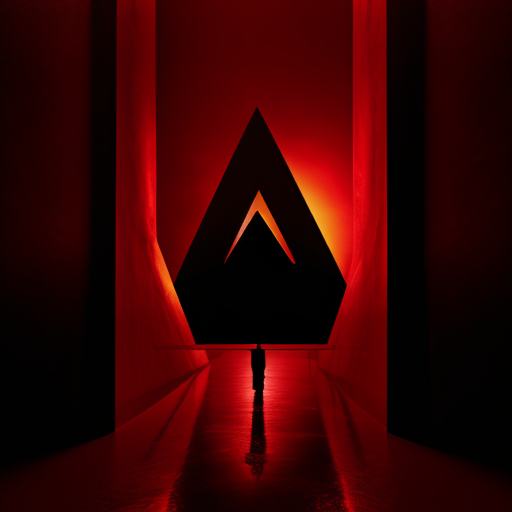

In [28]:
image_logs[0]['images'][0]

In [51]:
for timestep in range(len(latents_traj[0])):
    latents = latents_traj[0][timestep]
    report_tensor_stats(latents, f"Latents {timestep}")

Latents 0 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 1 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 2 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 3 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 4 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 5 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 6 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 7 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 8 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 9 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 10 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 11 | | Shape

### Change attention processor

In [22]:

torch.cuda.empty_cache()  # Frees unused GPU memory
torch.cuda.ipc_collect()  # Collects and releases memory from shared tensors


In [9]:
pipeline.transformer = replace_attn_processor(pipeline.transformer)
attnvis_store = PixArtAttentionVisualizer_Store(pipeline)
attnvis_store.setup_hooks()

Setting up hooks for PixArt attention modules:
- Block 0
- Block 1
- Block 2
- Block 3
- Block 4
- Block 5
- Block 6
- Block 7
- Block 8
- Block 9
- Block 10
- Block 11
- Block 12
- Block 13
- Block 14
- Block 15
- Block 16
- Block 17
- Block 18
- Block 19
- Block 20
- Block 21
- Block 22
- Block 23
- Block 24
- Block 25
- Block 26
- Block 27


In [24]:
validation_prompts

['triangle is to the upper left of square',
 'blue triangle is to the upper left of red square',
 'triangle is above and to the right of square',
 'blue circle is above and to the right of blue square',
 'triangle is to the left of square',
 'triangle is to the left of triangle',
 'circle is below red square',
 'red circle is to the left of blue square',
 'blue square is to the right of red circle',
 'red circle is above square',
 'triangle is above red circle',
 'red is above blue',
 'red is to the left of red',
 'blue triangle is above red triangle',
 'blue circle is above blue square']

In [10]:
# Clear residual memory from previous runs (without affecting loaded model)
#torch.cuda.empty_cache()
#torch.cuda.ipc_collect()
#torch.cuda.synchronize()
index = 4
attnvis_store.clear_activation()
image_logs, latents_traj, pred_traj, t_traj = visualize_prompts_with_traj(\
    pipeline, validation_prompts[index:index+1], num_inference_steps=14, guidance_scale=4.5, 
                                num_images_per_prompt=1, device=torch.device("cuda"), random_seed=1, weight_dtype=weight_dtype)
embed_infos = load_embed_and_mask(validation_prompts[index:index+1], prompt_cache_dir, config.model_max_length, device=torch.device("cuda"))

print(embed_infos[0]['prompt'])
prompt = embed_infos[0]['prompt']
# attention_mask_raw = embed_infos[0]['emb_mask'].cpu()
token_ids = tokenizer.encode(prompt)
word_tokens = tokenizer.convert_ids_to_tokens(token_ids)
word_tokens = [token.replace("▁", "") for token in word_tokens]

torch.Size([2, 120, 4096])
torch.Size([2, 120])
Function execution complete!
triangle is to the left of square


In [15]:
for timestep in range(len(latents_traj[0])):
    latents = latents_traj[0][timestep]
    report_tensor_stats(latents, f"Latents {timestep}")

Latents 0 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 1 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 2 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 3 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 4 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 5 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 6 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 7 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 8 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 9 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 10 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 11 | | Shape

In [17]:
# layer_i = 1 # note the 
for layer_i in range(24):
    timestep = -1
    self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
    cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
    report_tensor_stats(self_attn_map, f"Self-Attention Map {layer_i:02d} {timestep}")
    report_tensor_stats(cross_attn_map, f"Cross-Attention Map {layer_i:02d} {timestep}")

Self-Attention Map 00 -1 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross-Attention Map 00 -1 | | Shape: torch.Size([2, 16, 1024, 120]) | Non-NaN values: 3932160 | NaN values: 0 
Self-Attention Map 01 -1 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross-Attention Map 01 -1 | | Shape: torch.Size([2, 16, 1024, 120]) | Non-NaN values: 3932160 | NaN values: 0 
Self-Attention Map 02 -1 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross-Attention Map 02 -1 | | Shape: torch.Size([2, 16, 1024, 120]) | Non-NaN values: 3932160 | NaN values: 0 
Self-Attention Map 03 -1 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross-Attention Map 03 -1 | | Shape: torch.Size([2, 16, 1024, 120]) | Non-NaN values: 3932160 | NaN values: 0 
Self-Attention Map 04 -1 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values:

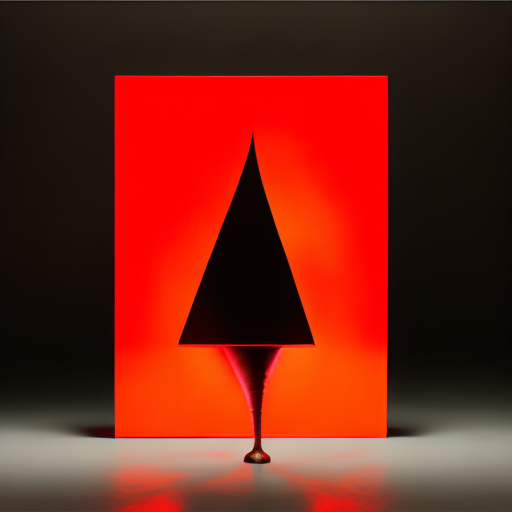

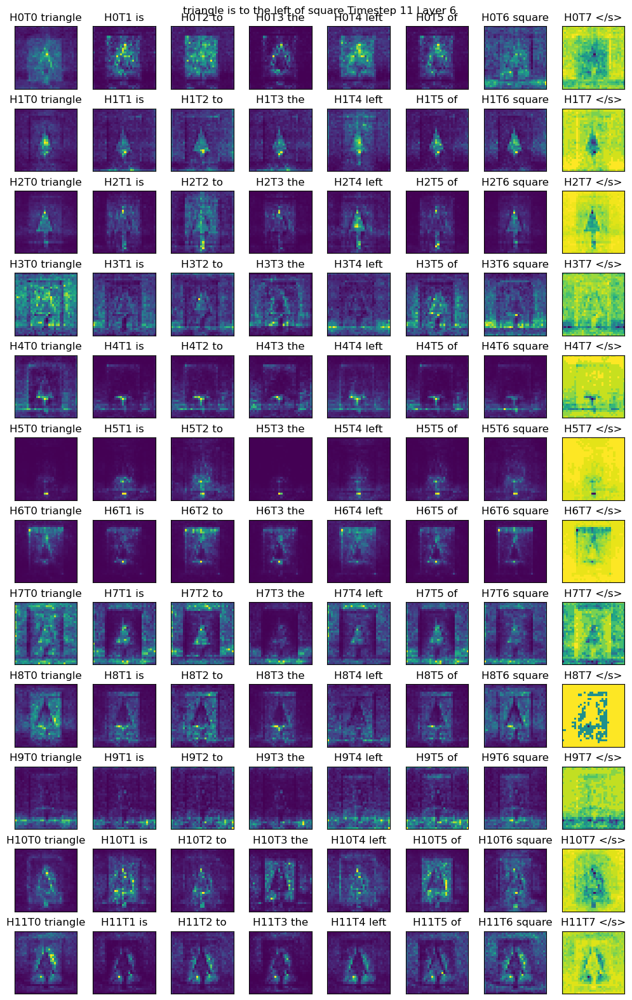

In [11]:
layer_i = 6 # note the 
timestep = 11
self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
sample_id = 0
display(image_logs[0]['images'][sample_id])
figh, axs = plt.subplots(12, len(word_tokens), figsize=(10, 16))
for head_id in range(12):
    for token_id in range(len(word_tokens)):
        ax = axs[head_id, token_id]
        ax.imshow(cross_attn_map[sample_id+1, 
                                 head_id, :, 
                                 token_id].view(32, 32).float().cpu().numpy())
        ax.axis('image')
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_title(f'H{head_id}T{token_id} {word_tokens[token_id]}')
        
plt.suptitle(f'{prompt} Timestep {timestep} Layer {layer_i}')
plt.tight_layout()


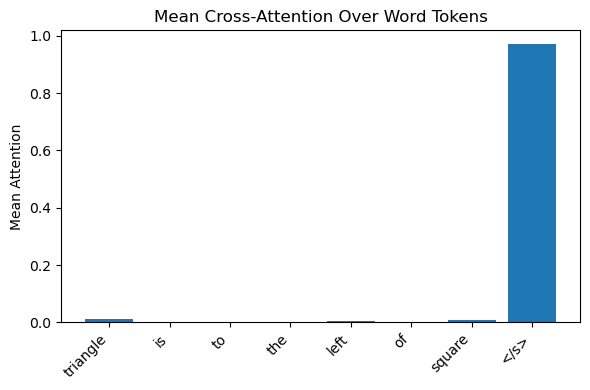

In [12]:

layer_i = 11
timestep = 11
self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]

plt.figure(figsize=(6, 4))
attn_means = cross_attn_map[1:, :, :, :].float().mean(dim=(0, 1, 2))
plt.bar(range(len(word_tokens)), attn_means[:len(word_tokens)])
plt.xticks(range(len(word_tokens)), word_tokens, rotation=45, ha='right')
plt.ylabel('Mean Attention')
plt.title('Mean Cross-Attention Over Word Tokens')
plt.tight_layout()
plt.show()

In [13]:
def plot_layer_across_timesteps(layer_i, attnvis_store, word_tokens, num_timesteps):
    """
    Given a particular layer, loop through all timesteps and plot as subplots.
    """
    fig, axes = plt.subplots(nrows=num_timesteps, figsize=(6, 4 * num_timesteps))
    
    for timestep in range(num_timesteps):
        cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
        attn_means = cross_attn_map[1:, :, :, :].float().mean(dim=(0, 1, 2))
        
        ax = axes[timestep] if num_timesteps > 1 else axes
        ax.bar(range(len(word_tokens)), attn_means[:len(word_tokens)])
        ax.set_xticks(range(len(word_tokens)))
        ax.set_xticklabels(word_tokens, rotation=45, ha='right')
        ax.set_ylabel('Mean Attention')
        ax.set_title(f'Mean Cross-Attention (Layer {layer_i}, Timestep {timestep})')
    
    plt.tight_layout()
    plt.show()


def plot_timestep_across_layers(timestep, attnvis_store, word_tokens, num_layers):
    """
    Given a particular timestep, loop through all layers and plot as subplots.
    """
    fig, axes = plt.subplots(nrows=num_layers, figsize=(6, 4 * num_layers))
    
    for layer_i in range(num_layers):
        cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
        attn_means = cross_attn_map[1:, :, :, :].float().mean(dim=(0, 1, 2))
        
        ax = axes[layer_i] if num_layers > 1 else axes
        ax.bar(range(len(word_tokens)), attn_means[:len(word_tokens)])
        ax.set_xticks(range(len(word_tokens)))
        ax.set_xticklabels(word_tokens, rotation=45, ha='right')
        ax.set_ylabel('Mean Attention')
        ax.set_title(f'Mean Cross-Attention (Layer {layer_i}, Timestep {timestep})')
    
    plt.tight_layout()
    plt.show()


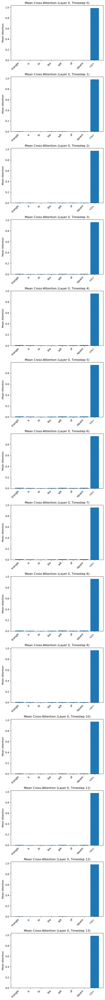

In [14]:
layer_i = 0
num_timesteps=14
plot_layer_across_timesteps(layer_i, attnvis_store, word_tokens, num_timesteps)

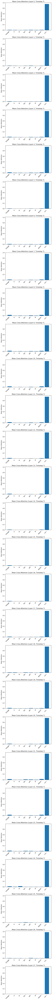

In [15]:
timestep=7
num_layers = 28
plot_timestep_across_layers(timestep, attnvis_store, word_tokens, num_layers)

In [48]:

def plot_mean_attention_across_timesteps(token_id, num_layers, num_timesteps, attnvis_store, word_tokens, layer_range=None):
    """
    Plots mean attention across timesteps for a given token index, aggregated over layers.

    Args:
        token_id (int): The index of the token in `word_tokens` to track attention.
        num_layers (int): The total number of layers in the model.
        num_timesteps (int): The total number of timesteps.
        attnvis_store: Object storing attention activations.
        word_tokens (list): List of tokenized words.
        layer_range (list, optional): Range of layers to plot (default is all layers).
    """
    if layer_range is None:
        layer_range = range(num_layers)  # Default to all layers

    # Prepare the color spectrum for layers
    colors = plt.cm.viridis(np.linspace(0, 1, len(layer_range)))

    plt.figure(figsize=(12, 6))

    for i, layer_i in enumerate(layer_range):
        mean_attention = []

        for timestep in range(num_timesteps):
            cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
            attn_means = cross_attn_map[1, :, :, token_id].float().mean(dim=(0, 1)).cpu().numpy()  # Averaging over batch & heads
            mean_attention.append(attn_means)

        plt.plot(range(num_timesteps), mean_attention, label=f'Layer {layer_i}', color=colors[i])

    plt.xlabel("Timesteps")
    plt.ylabel("Mean Attention")
    plt.title(f"Mean Attention Over Timesteps for Token '{word_tokens[token_id]}'")
    plt.legend(title="Layer", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


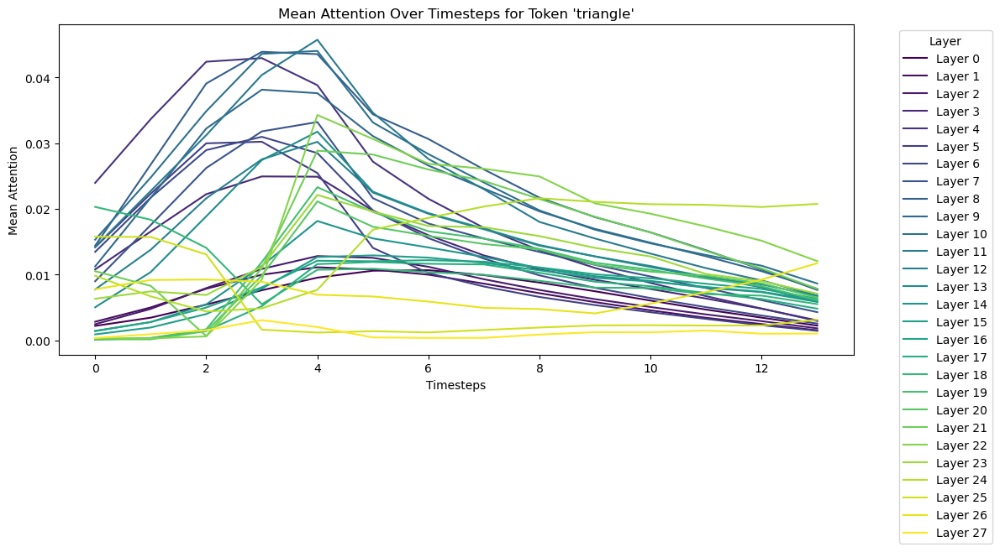

In [49]:
plot_mean_attention_across_timesteps(
    token_id=0,  # The token index within word_tokens
    num_layers=28,  # Adjust based on model architecture
    num_timesteps=14,  # Adjust based on available timesteps
    attnvis_store=attnvis_store,
    word_tokens=word_tokens
)


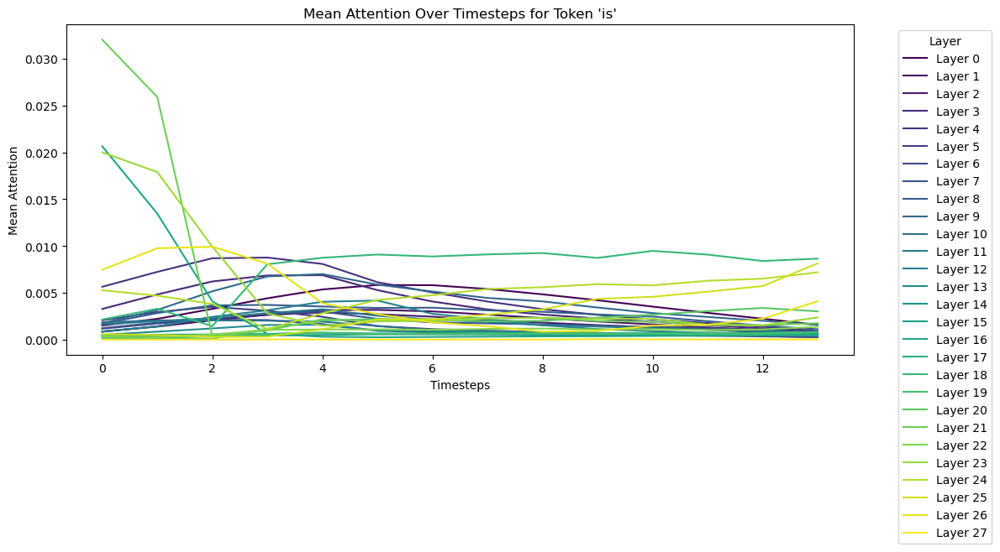

In [50]:
plot_mean_attention_across_timesteps(
    token_id=1,  # The token index within word_tokens
    num_layers=28,  # Adjust based on model architecture
    num_timesteps=14,  # Adjust based on available timesteps
    attnvis_store=attnvis_store,
    word_tokens=word_tokens
)


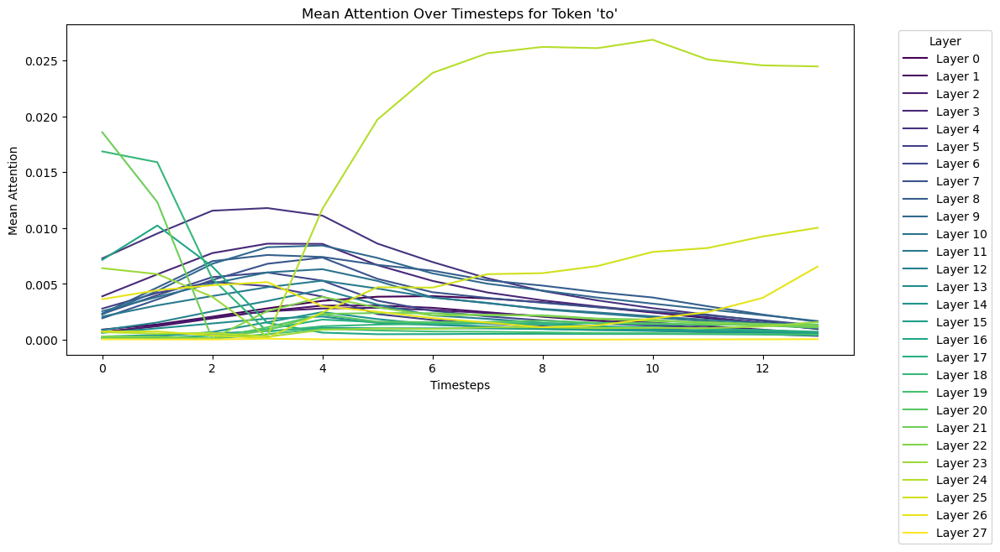

In [51]:
plot_mean_attention_across_timesteps(
    token_id=2,  # The token index within word_tokens
    num_layers=28,  # Adjust based on model architecture
    num_timesteps=14,  # Adjust based on available timesteps
    attnvis_store=attnvis_store,
    word_tokens=word_tokens
)


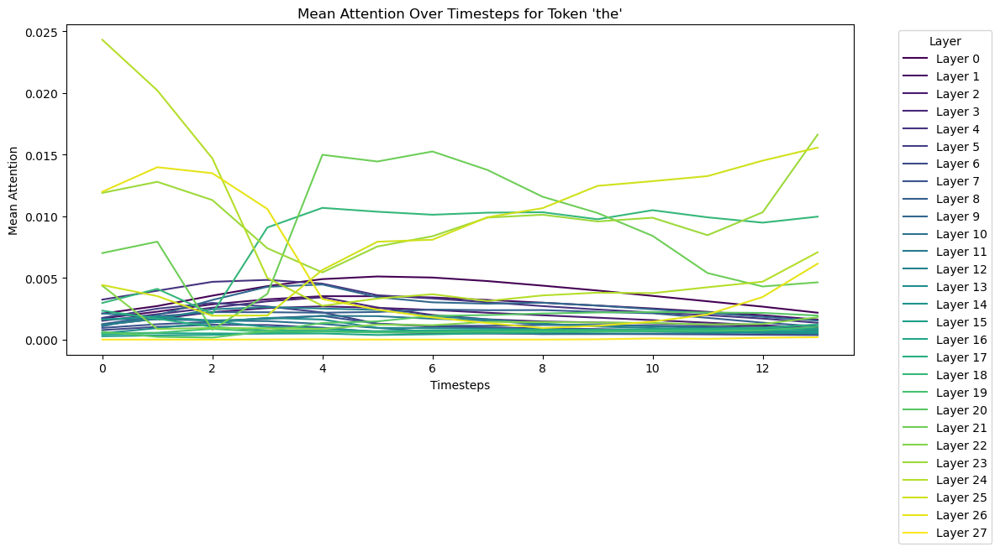

In [52]:
plot_mean_attention_across_timesteps(
    token_id=3,  # The token index within word_tokens
    num_layers=28,  # Adjust based on model architecture
    num_timesteps=14,  # Adjust based on available timesteps
    attnvis_store=attnvis_store,
    word_tokens=word_tokens
)


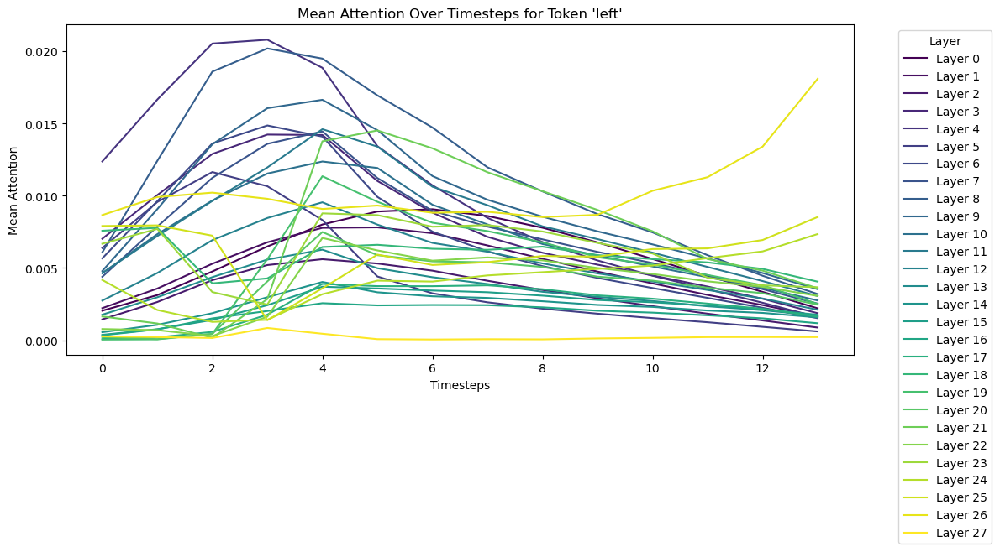

In [53]:
plot_mean_attention_across_timesteps(
    token_id=4,  # The token index within word_tokens
    num_layers=28,  # Adjust based on model architecture
    num_timesteps=14,  # Adjust based on available timesteps
    attnvis_store=attnvis_store,
    word_tokens=word_tokens
)


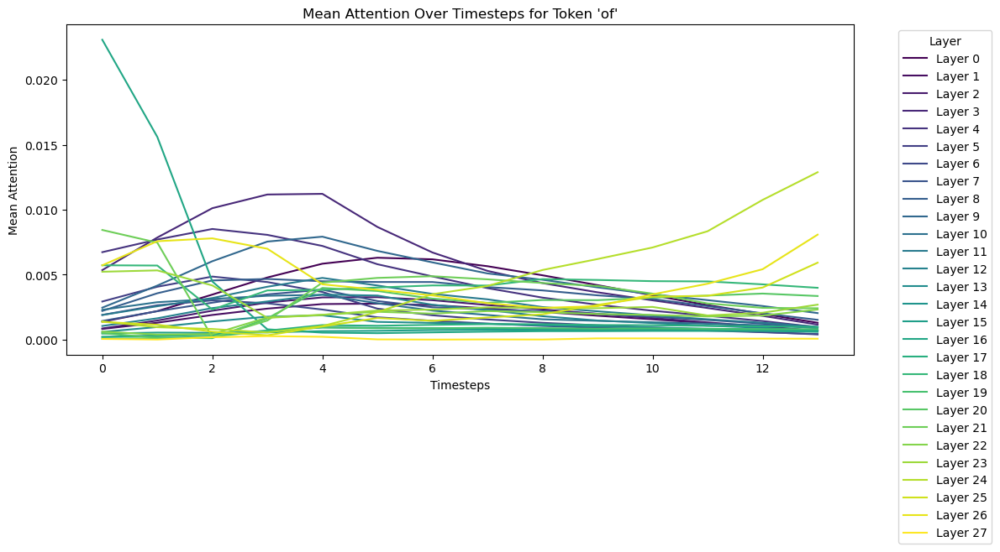

In [54]:
plot_mean_attention_across_timesteps(
    token_id=5,  # The token index within word_tokens
    num_layers=28,  # Adjust based on model architecture
    num_timesteps=14,  # Adjust based on available timesteps
    attnvis_store=attnvis_store,
    word_tokens=word_tokens
)


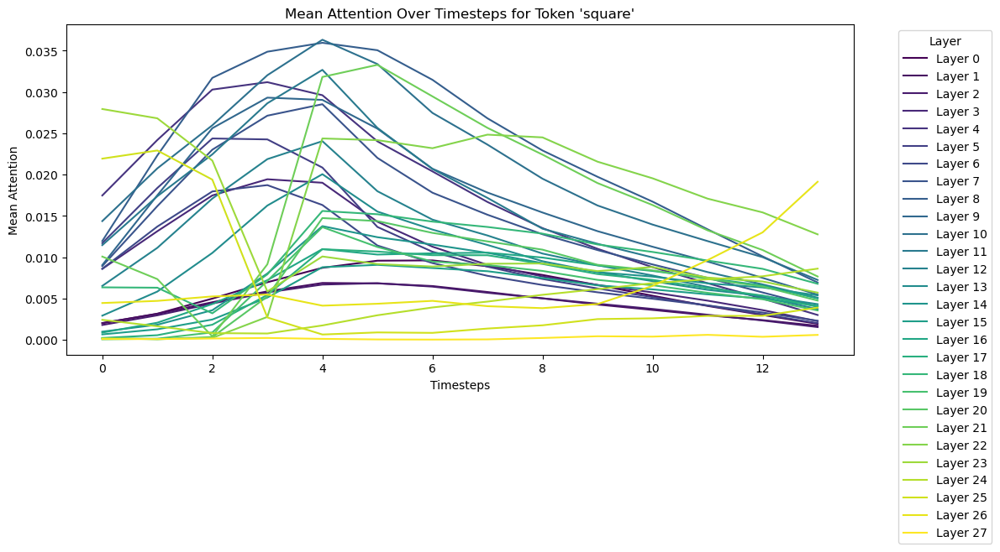

In [55]:
plot_mean_attention_across_timesteps(
    token_id=6,  # The token index within word_tokens
    num_layers=28,  # Adjust based on model architecture
    num_timesteps=14,  # Adjust based on available timesteps
    attnvis_store=attnvis_store,
    word_tokens=word_tokens
)


IndexError: list index out of range

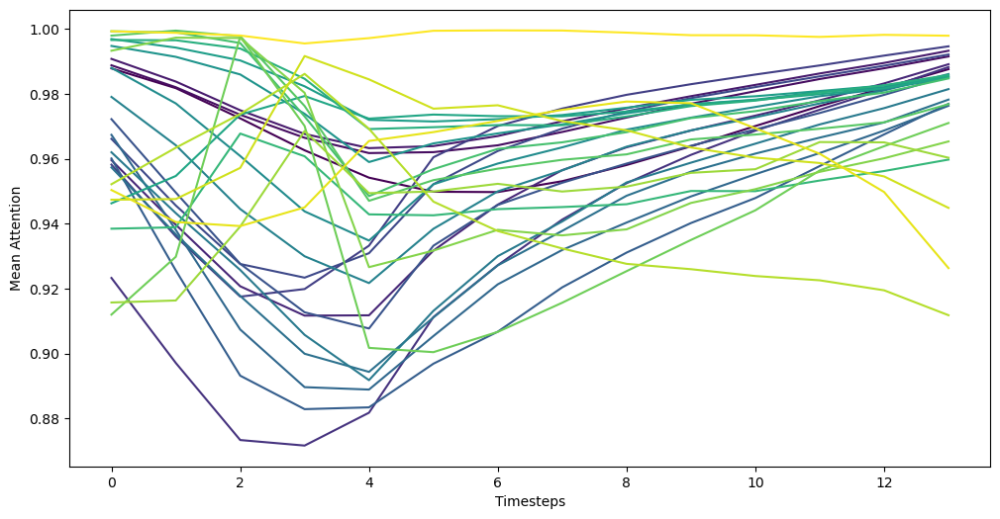

In [57]:
plot_mean_attention_across_timesteps(
    token_id=7,  # The token index within word_tokens
    num_layers=28,  # Adjust based on model architecture
    num_timesteps=14,  # Adjust based on available timesteps
    attnvis_store=attnvis_store,
    word_tokens=word_tokens
)


In [28]:

def plot_attention_heads(layer_i, timestep, validation_prompts, prompt_index, attnvis_store, embed_infos):
    """
    Plots the cross-attention maps for all heads at a given layer and timestep.
    
    Args:
        layer_i (int): The layer index to visualize.
        timestep (int): The timestep to visualize.
        validation_prompts (list): List of validation prompts.
        prompt_index (int): Index of the prompt to use from validation_prompts.
        attnvis_store: Object storing activation maps.
        embed_infos: Embedding information containing the token mask.
    """
    # Define your sentence as tokens
    sentence = validation_prompts[prompt_index]
    word_tokens = sentence.split()  # Tokenizing sentence into words

    prompt_token_mask = embed_infos[0]['emb_mask'].cpu().squeeze(0).bool()
    sample_id = 0

    # Retrieve self and cross attention maps
    self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
    cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]

    # Create figure
    plt.figure(figsize=(15, 5))

    for head_id in range(12): 
        plt.subplot(2, 6, head_id + 1)
        attn_matrix = cross_attn_map[1 + sample_id, head_id, :, 0:len(word_tokens)].float().cpu().numpy()
        
        plt.imshow(attn_matrix, aspect='auto', cmap='viridis')
        plt.colorbar()
        
        # Set x-axis ticks with words
        plt.xticks(ticks=range(len(word_tokens)), labels=word_tokens, rotation=45, ha='right')
        
        plt.title(f'Head {head_id}')

    plt.tight_layout()
    plt.show()


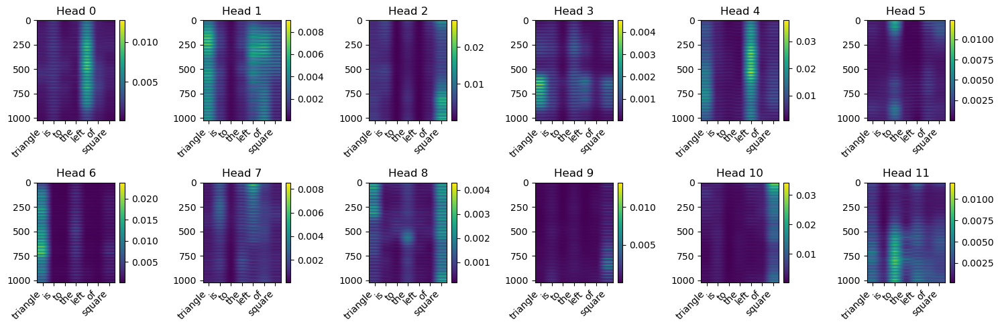

In [29]:
plot_attention_heads(layer_i=0, 
                     timestep=1, 
                     validation_prompts=validation_prompts, 
                     prompt_index=4, 
                     attnvis_store=attnvis_store, 
                     embed_infos=embed_infos)


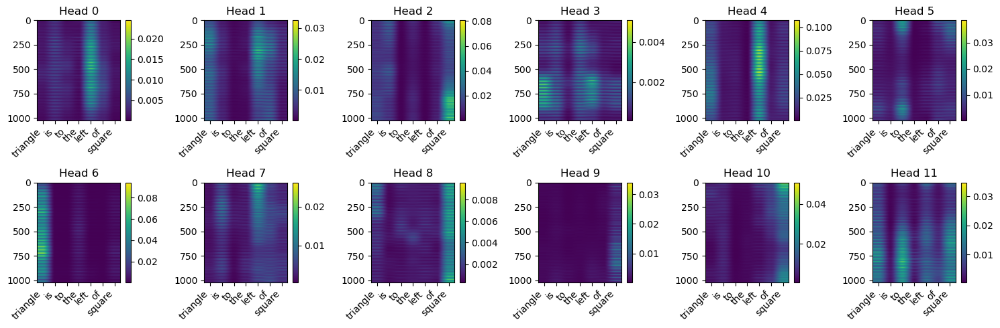

In [30]:
plot_attention_heads(layer_i=0, 
                     timestep=7, 
                     validation_prompts=validation_prompts, 
                     prompt_index=4, 
                     attnvis_store=attnvis_store, 
                     embed_infos=embed_infos)


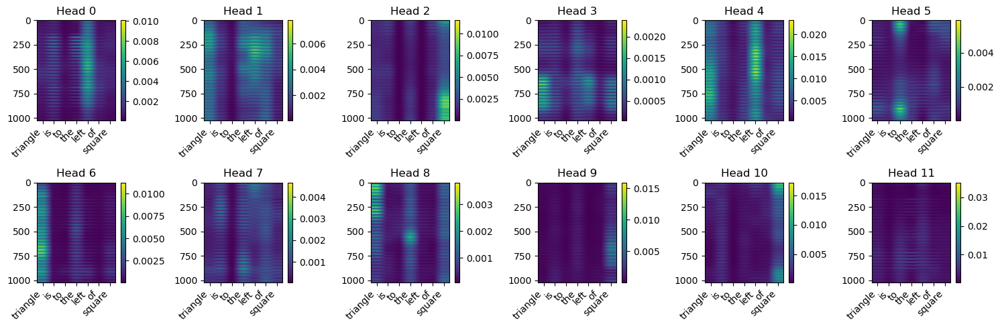

In [31]:
plot_attention_heads(layer_i=0, 
                     timestep=13, 
                     validation_prompts=validation_prompts, 
                     prompt_index=4, 
                     attnvis_store=attnvis_store, 
                     embed_infos=embed_infos)


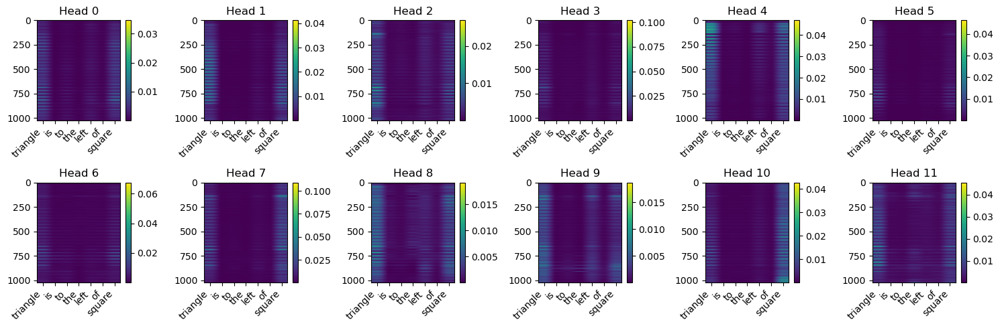

In [32]:
plot_attention_heads(layer_i=14, 
                     timestep=13, 
                     validation_prompts=validation_prompts, 
                     prompt_index=4, 
                     attnvis_store=attnvis_store, 
                     embed_infos=embed_infos)


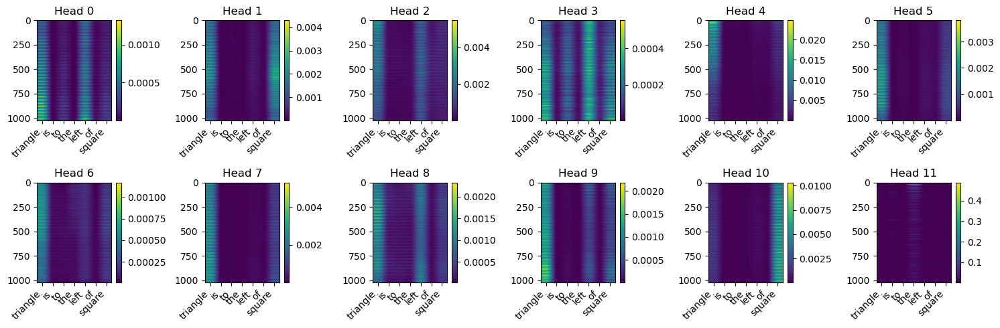

In [34]:
plot_attention_heads(layer_i=14, 
                     timestep=0, 
                     validation_prompts=validation_prompts, 
                     prompt_index=4, 
                     attnvis_store=attnvis_store, 
                     embed_infos=embed_infos)


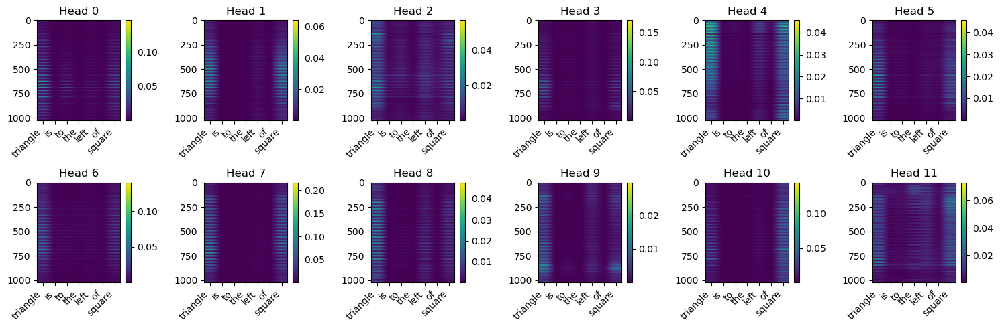

In [36]:
plot_attention_heads(layer_i=14, 
                     timestep=7, 
                     validation_prompts=validation_prompts, 
                     prompt_index=4, 
                     attnvis_store=attnvis_store, 
                     embed_infos=embed_infos)


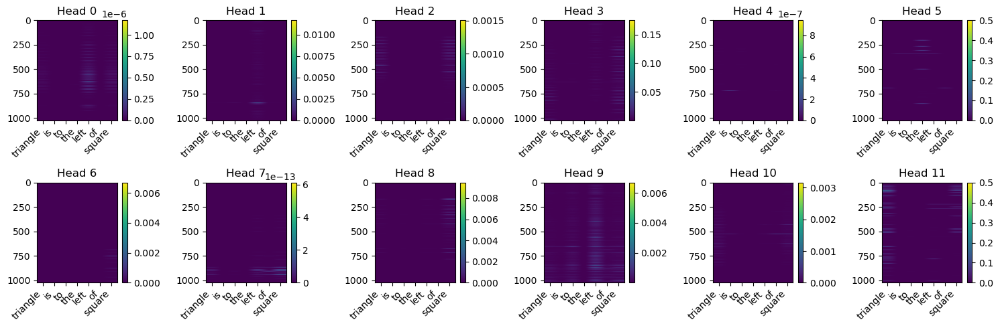

In [33]:
plot_attention_heads(layer_i=27, 
                     timestep=13, 
                     validation_prompts=validation_prompts, 
                     prompt_index=4, 
                     attnvis_store=attnvis_store, 
                     embed_infos=embed_infos)


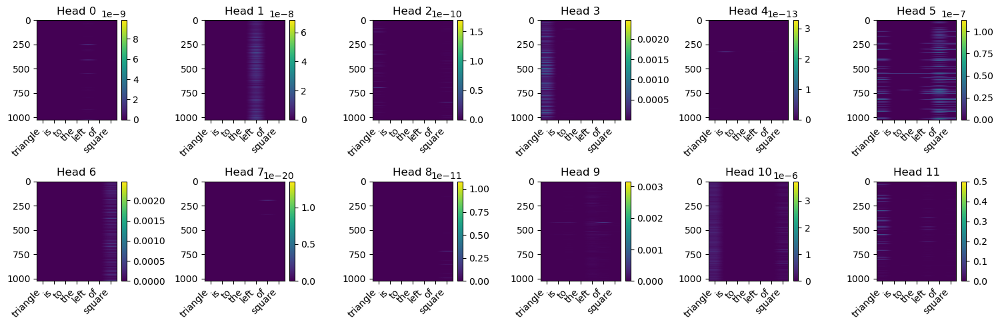

In [37]:
plot_attention_heads(layer_i=27, 
                     timestep=1, 
                     validation_prompts=validation_prompts, 
                     prompt_index=4, 
                     attnvis_store=attnvis_store, 
                     embed_infos=embed_infos)


### Older under over flow problem

In [33]:
# Clear residual memory from previous runs (without affecting loaded model)
#torch.cuda.empty_cache()
#torch.cuda.ipc_collect()
#torch.cuda.synchronize()

attnvis_store.clear_activation()
image_logs, latents_traj, pred_traj, t_traj = visualize_prompts_with_traj(\
    pipeline, validation_prompts[5:6], num_inference_steps=20, guidance_scale=4.5, 
                                num_images_per_prompt=1, device=torch.device("cuda"), random_seed=1, weight_dtype=torch.float16)
embed_infos = load_embed_and_mask(validation_prompts[5:6], prompt_cache_dir, config.model_max_length, device=torch.device("cuda"))

print(embed_infos[0]['prompt'])
prompt = embed_infos[0]['prompt']
# attention_mask_raw = embed_infos[0]['emb_mask'].cpu()
token_ids = tokenizer.encode(prompt)
word_tokens = tokenizer.convert_ids_to_tokens(token_ids)
word_tokens = [token.replace("▁", "") for token in word_tokens]

torch.Size([2, 120, 4096])
torch.Size([2, 120])
Function execution complete!
triangle is to the left of triangle


/n/home12/binxuwang/.conda/envs/torch2/lib/python3.10/site-packages/diffusers/image_processor.py:147: RuntimeWarning: invalid value encountered in cast
  images = (images * 255).round().astype("uint8")


In [22]:
layer_i = 11 # note the 
timestep = 0
self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
print(self_attn_map.shape, cross_attn_map.shape)

torch.Size([2, 16, 1024, 1024]) torch.Size([2, 16, 1024, 120])


In [35]:
# layer_i = 1 # note the 
for layer_i in range(24):
    timestep = 0
    self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
    cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
    report_tensor_stats(self_attn_map, f"Self-Attention Map {layer_i:02d} {timestep}")
    report_tensor_stats(cross_attn_map, f"Cross-Attention Map {layer_i:02d} {timestep}")

Self-Attention Map 00 0 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross-Attention Map 00 0 | | Shape: torch.Size([2, 16, 1024, 120]) | Non-NaN values: 3932160 | NaN values: 0 
Self-Attention Map 01 0 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross-Attention Map 01 0 | | Shape: torch.Size([2, 16, 1024, 120]) | Non-NaN values: 3932160 | NaN values: 0 
Self-Attention Map 02 0 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross-Attention Map 02 0 | | Shape: torch.Size([2, 16, 1024, 120]) | Non-NaN values: 3932160 | NaN values: 0 
Self-Attention Map 03 0 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross-Attention Map 03 0 | | Shape: torch.Size([2, 16, 1024, 120]) | Non-NaN values: 3932160 | NaN values: 0 
Self-Attention Map 04 0 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross

In [44]:
# Clear residual memory from previous runs (without affecting loaded model)
#torch.cuda.empty_cache()
#torch.cuda.ipc_collect()
#torch.cuda.synchronize()

attnvis_store.clear_activation()
image_logs, latents_traj, pred_traj, t_traj = visualize_prompts_with_traj(\
    pipeline, validation_prompts[5:6], num_inference_steps=20, guidance_scale=4.5, 
                                num_images_per_prompt=1, device=torch.device("cuda"), random_seed=1, weight_dtype=torch.float16)
embed_infos = load_embed_and_mask(validation_prompts[5:6], prompt_cache_dir, config.model_max_length, device=torch.device("cuda"))

print(embed_infos[0]['prompt'])
prompt = embed_infos[0]['prompt']
# attention_mask_raw = embed_infos[0]['emb_mask'].cpu()
token_ids = tokenizer.encode(prompt)
word_tokens = tokenizer.convert_ids_to_tokens(token_ids)
word_tokens = [token.replace("▁", "") for token in word_tokens]

torch.Size([2, 120, 4096])
torch.Size([2, 120])
Function execution complete!
triangle is to the left of triangle


/n/home12/binxuwang/.conda/envs/torch2/lib/python3.10/site-packages/diffusers/image_processor.py:147: RuntimeWarning: invalid value encountered in cast
  images = (images * 255).round().astype("uint8")


In [45]:
for timestep in range(len(latents_traj[0])):
    latents = latents_traj[0][timestep]
    report_tensor_stats(latents, f"Latents {timestep}")

Latents 0 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 1 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 0 | NaN values: 16384 
Latents 2 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 0 | NaN values: 16384 
Latents 3 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 0 | NaN values: 16384 
Latents 4 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 0 | NaN values: 16384 
Latents 5 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 0 | NaN values: 16384 
Latents 6 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 0 | NaN values: 16384 
Latents 7 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 0 | NaN values: 16384 
Latents 8 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 0 | NaN values: 16384 
Latents 9 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 0 | NaN values: 16384 
Latents 10 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 0 | NaN values: 16384 
Latents 11 | | Shape

In [46]:
layer_i = 11 # note the 
timestep = -1
self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
print(self_attn_map.shape, cross_attn_map.shape)

torch.Size([2, 16, 1024, 1024]) torch.Size([2, 16, 1024, 120])


In [47]:
# layer_i = 1 # note the 
for layer_i in range(24):
    timestep = 0
    self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
    cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
    report_tensor_stats(self_attn_map, f"Self-Attention Map {layer_i:02d} {timestep}")
    report_tensor_stats(cross_attn_map, f"Cross-Attention Map {layer_i:02d} {timestep}")

Self-Attention Map 00 0 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross-Attention Map 00 0 | | Shape: torch.Size([2, 16, 1024, 120]) | Non-NaN values: 3932160 | NaN values: 0 
Self-Attention Map 01 0 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross-Attention Map 01 0 | | Shape: torch.Size([2, 16, 1024, 120]) | Non-NaN values: 3932160 | NaN values: 0 
Self-Attention Map 02 0 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross-Attention Map 02 0 | | Shape: torch.Size([2, 16, 1024, 120]) | Non-NaN values: 3932160 | NaN values: 0 
Self-Attention Map 03 0 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross-Attention Map 03 0 | | Shape: torch.Size([2, 16, 1024, 120]) | Non-NaN values: 3932160 | NaN values: 0 
Self-Attention Map 04 0 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross

In [17]:
print(f"Total non-NaN values: {torch.sum(~torch.isnan(self_attn_map)).item()}")
print(f"Shape: {self_attn_map.shape}")

Total non-NaN values: 0
Shape: torch.Size([2, 16, 1024, 1024])


In [17]:
cross_attn_map

tensor([[[[nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan],
          ...,
          [nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan]],

         [[nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan],
          ...,
          [nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan]],

         [[nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan],
          ...,
          [nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan]],

         ...,

         [[nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, n

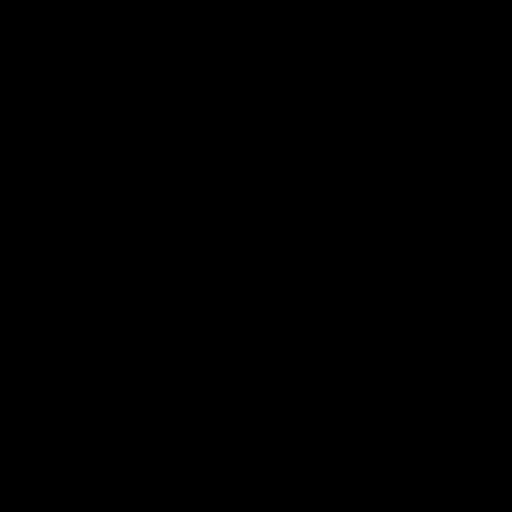

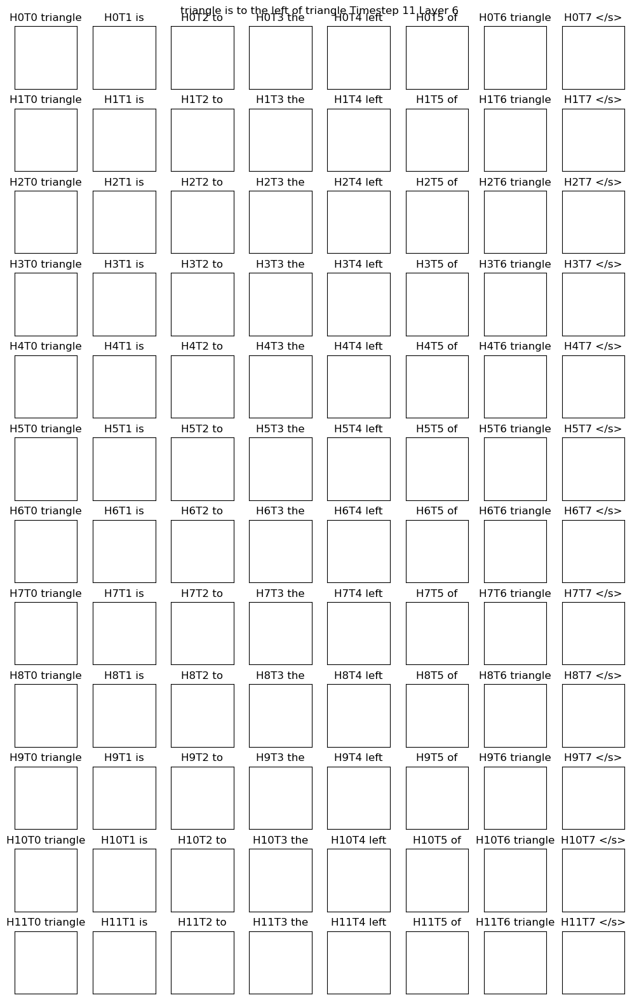

In [34]:
layer_i = 6 # note the 
timestep = 11
self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
sample_id = 0
display(image_logs[0]['images'][sample_id])
figh, axs = plt.subplots(12, len(word_tokens), figsize=(10, 16))
for head_id in range(12):
    for token_id in range(len(word_tokens)):
        ax = axs[head_id, token_id]
        ax.imshow(cross_attn_map[sample_id, 
                                 head_id, :, 
                                 token_id].view(32, 32).cpu().numpy())
        ax.axis('image')
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_title(f'H{head_id}T{token_id} {word_tokens[token_id]}')
        
plt.suptitle(f'{prompt} Timestep {timestep} Layer {layer_i}')
plt.tight_layout()


### Visualize cross attention matrix 

In [87]:
prompt_slice = slice(0, 1)
attnvis_store.clear_activation()
image_logs_sel, latents_traj_sel, pred_traj_sel, t_traj_sel = visualize_prompts_with_traj(\
    pipeline, validation_prompts[prompt_slice], prompt_cache_dir, config.model_max_length, weight_dtype, random_seed=0)

embed_infos = load_embed_and_mask(validation_prompts[prompt_slice], prompt_cache_dir, config.model_max_length, device="cuda")
print(embed_infos[0]['prompt'])
prompt = embed_infos[0]['prompt']
# attention_mask_raw = embed_infos[0]['emb_mask'].cpu()
token_ids = tokenizer.encode(prompt)
word_tokens = tokenizer.convert_ids_to_tokens(token_ids)
word_tokens = [token.replace("▁", "") for token in word_tokens]
print(word_tokens)

torch.Size([50, 20, 4096])
torch.Size([50, 20])
triangle is to the upper left of square
['triangle', 'is', 'to', 'the', 'upper', 'left', 'of', 'square', '</s>']


In [88]:
layer_i = 11 # note the 
timestep = 1
self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
print(self_attn_map.shape, cross_attn_map.shape)

torch.Size([50, 12, 64, 64]) torch.Size([50, 12, 64, 20])


In [89]:
word_tokens

['triangle', 'is', 'to', 'the', 'upper', 'left', 'of', 'square', '</s>']

#### High attention to "meaningless" tokens

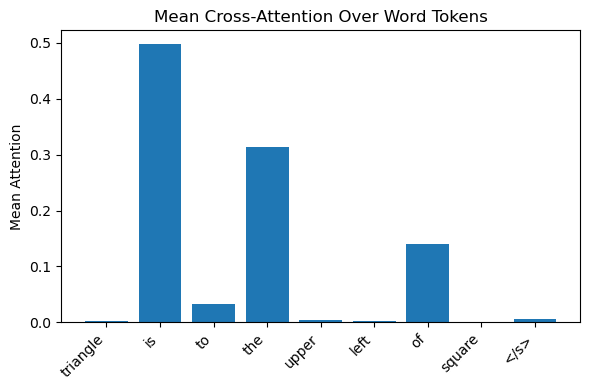

In [90]:

layer_i = 11 # note the 
timestep = 11
self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]

plt.figure(figsize=(6, 4))
attn_means = cross_attn_map[25:, :, :, :].mean(dim=(0, 1, 2))
plt.bar(range(len(word_tokens)), attn_means[:len(word_tokens)])
plt.xticks(range(len(word_tokens)), word_tokens, rotation=45, ha='right')
plt.ylabel('Mean Attention')
plt.title('Mean Cross-Attention Over Word Tokens')
plt.tight_layout()
plt.show()

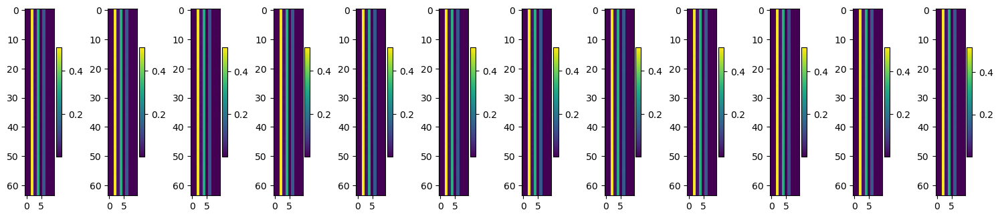

In [73]:
prompt_token_mask = embed_infos[0]['emb_mask'].cpu().squeeze(0).bool()
sample_id = 1
layer_i = 0 # note the 
timestep = 1
self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
plt.figure(figsize=(15, 5))
for head_id in range(12): 
    plt.subplot(1, 12, head_id + 1)
    plt.imshow(cross_attn_map[25 + sample_id, head_id, :, prompt_token_mask].cpu().numpy())
    # plt.imshow(cross_attn_map[sample_id, head_id :, :].cpu().numpy())
    plt.colorbar()
    # plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
layer_i = 6 # note the 
timestep = 11
self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
sample_id = 15
display(image_logs_sel[0]['images'][sample_id])
figh, axs = plt.subplots(12, len(word_tokens), figsize=(10, 16))
for head_id in range(12):
    for token_id in range(len(word_tokens)):
        ax = axs[head_id, token_id]
        ax.imshow(cross_attn_map[25 + sample_id, 
                                 head_id, :, 
                                 token_id].view(8, 8).cpu().numpy())
        ax.axis('image')
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_title(f'H{head_id}T{token_id} {word_tokens[token_id]}')
        
plt.suptitle(f'{prompt} Timestep {timestep} Layer {layer_i}')
plt.tight_layout()

In [ ]:
prompt_token_mask

tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])

### Run diffusion with custom prompts

In [7]:
import os
import torch as th
from utils.image_utils import pil_images_to_grid
from utils.custom_text_encoding_utils import save_prompt_embeddings_randemb, RandomEmbeddingEncoder, RandomEmbeddingEncoder_wPosEmb

In [8]:
def tokenize_embed_prompt(prompt, tokenizer, text_encoder, max_length=20, device="cuda"):
    uncond = tokenizer("", max_length=max_length, padding="max_length", truncation=True, return_tensors="pt").to(device)
    uncond_prompt_embeds = text_encoder(uncond.input_ids, attention_mask=uncond.attention_mask)[0]
    uncond_result = {'caption_embeds': uncond_prompt_embeds, 'emb_mask': uncond.attention_mask, 'prompt': '', 'token_ids': uncond.input_ids}
    caption_token = tokenizer(prompt, max_length=max_length, padding="max_length", truncation=True, return_tensors="pt").to(device)
    caption_emb = text_encoder(caption_token.input_ids, attention_mask=caption_token.attention_mask)[0]
    cond_result = {'caption_embeds': caption_emb, 'emb_mask': caption_token.attention_mask, 'prompt': prompt, 'token_ids': caption_token.input_ids}
    return uncond_result, cond_result

In [9]:
@torch.inference_mode()
def visualize_prompts_with_traj_from_embed_dict(pipeline, uncond_prompt_dict, cond_prompt_dict, weight_dtype=torch.float16,
                   num_inference_steps=14, guidance_scale=4.5, num_images_per_prompt=25, device="cuda", random_seed=0):
    # logger.info("Running validation... ")
    # device = accelerator.device
    # model = accelerator.unwrap_model(model)
    pipeline = pipeline.to(device)
    pipeline.set_progress_bar_config(disable=True)
    if random_seed is None:
        generator = None
    else:
        generator = torch.Generator(device=device).manual_seed(random_seed)
    image_logs = []
    images = []
    latents = []
    pred_traj = []
    latents_traj = []
    t_traj = []
    visualized_prompts = []
    # uncond_data = torch.load(f'{prompt_cache_dir}/uncond_{max_length}token.pth', map_location='cpu')
    uncond_prompt_embeds = uncond_prompt_dict['caption_embeds'].to(device)
    uncond_prompt_attention_mask = uncond_prompt_dict['emb_mask'].to(device)
    # for _, prompt in enumerate(validation_prompts):
    caption_embs = cond_prompt_dict['caption_embeds'].to(device)
    emb_masks = cond_prompt_dict['emb_mask'].to(device)
    output = pipeline(
        num_inference_steps=num_inference_steps,
        num_images_per_prompt=num_images_per_prompt,
        generator=generator,
        guidance_scale=guidance_scale,
        prompt_embeds=caption_embs,
        prompt_attention_mask=emb_masks,
        negative_prompt=None,
        negative_prompt_embeds=uncond_prompt_embeds,
        negative_prompt_attention_mask=uncond_prompt_attention_mask,
        use_resolution_binning=False, # need this for smaller images like ours. 
        return_sample_pred_traj=True,
        output_type="latent",
    )
    latents.append(output[0].images)
    pred_traj.append(output[1])
    latents_traj.append(output[2])
    t_traj.append(output[3])
    visualized_prompts.append(prompt)
    # flush()
    for latent in latents:
        images.append(pipeline.vae.decode(latent.to(weight_dtype) / pipeline.vae.config.scaling_factor, return_dict=False)[0])
    for prompt, image in zip(visualized_prompts, images):
        image = pipeline.image_processor.postprocess(image, output_type="pil")
        image_logs.append({"validation_prompt": prompt, "images": image})
    
    return image_logs, latents_traj, pred_traj, t_traj

In [41]:
@torch.inference_mode()
def pipeline_inference_custom(pipeline, prompt, negative_prompt="", num_inference_steps=14, num_images_per_prompt=25, guidance_scale=4.5, random_seed=0, max_sequence_length=20, 
                              return_sample_pred_traj=True, output_type="latent", device="cuda", weight_dtype=torch.float16, **kwargs):
    pipeline = pipeline.to(device)
    output = pipeline(prompt=prompt,
         negative_prompt=negative_prompt,
         num_inference_steps=num_inference_steps,
         num_images_per_prompt=num_images_per_prompt,
         generator=torch.Generator(device=device).manual_seed(random_seed),
         guidance_scale=guidance_scale,
         max_sequence_length=max_sequence_length,
         use_resolution_binning=False,
         return_sample_pred_traj=return_sample_pred_traj,
         output_type=output_type,
         **kwargs,
    )
    if return_sample_pred_traj:
        latents = output[0].images
        pred_traj = output[1]
        latents_traj = output[2]
        t_traj = output[3]
    else:
        latents = output.images
        pred_traj = None
        latents_traj = None
        t_traj = None
    images = pipeline.vae.decode(latents.clone().to(weight_dtype) / pipeline.vae.config.scaling_factor, return_dict=False)[0]
    image_logs = []
    images = pipeline.image_processor.postprocess(images, output_type="pil")
    image_logs.append({"validation_prompt": prompt, "images": images})
    return image_logs, pred_traj, latents_traj, t_traj

In [42]:
pipeline._execution_device

AttributeError: 'PixArtAlphaPipeline_custom' object has no attribute '_execution_device'

In [43]:
pipeline = pipeline.to("cuda")

AttributeError: 'RandomEmbeddingEncoder_wPosEmb' object has no attribute 'dtype'

In [35]:
text_feat_dir = '/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/objectRel_pilot_rndembposemb/caption_feature_wmask'
tokenizer = T5Tokenizer.from_pretrained(T5_path)
rnd_encoding = th.load(join(text_feat_dir, "word_embedding_dict.pt"))
rndpos_encoder = RandomEmbeddingEncoder_wPosEmb(rnd_encoding["embedding_dict"], 
                                              rnd_encoding["input_ids2dict_ids"], 
                                              rnd_encoding["dict_ids2input_ids"], 
                                              max_seq_len=20, embed_dim=4096,
                                              wpe_scale=1/6).to("cuda")
pipeline.text_encoder = rndpos_encoder
# pipeline.text_encoder.dtype = torch.float
pipeline.tokenizer = tokenizer

/n/home12/binxuwang/.conda/envs/torch2/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [31]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "red blue triangle", return_sample_pred_traj=False, random_seed=0, device="cuda")
pil_images_to_grid(images_logs[0]['images'])

AttributeError: 'PixArtAlphaPipeline_custom' object has no attribute '_execution_device'

torch.Size([50, 20, 4096])
torch.Size([50, 20])


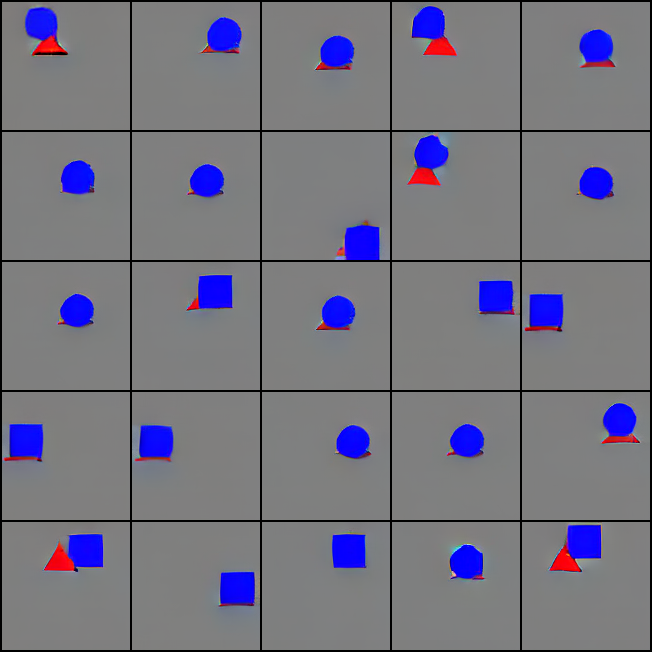

In [178]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "triangle red blue", return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

torch.Size([50, 20, 4096])
torch.Size([50, 20])


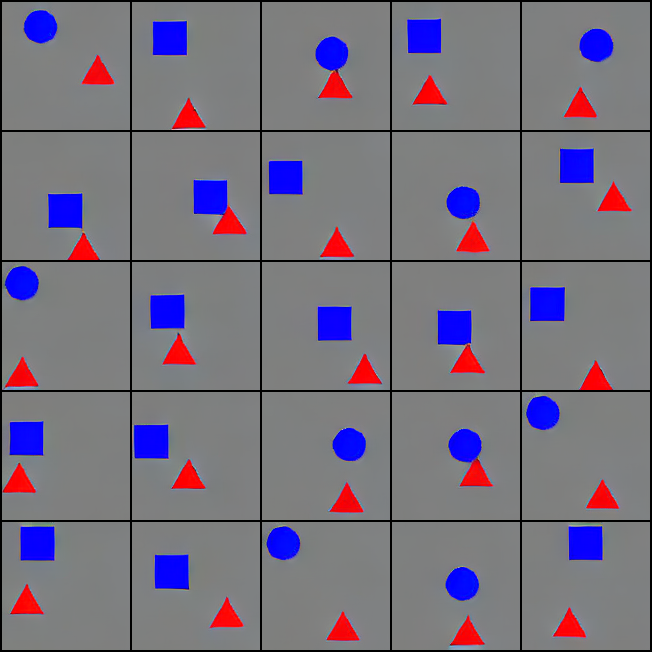

In [199]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "triangle red the the the the below ", return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

torch.Size([50, 20, 4096])
torch.Size([50, 20])


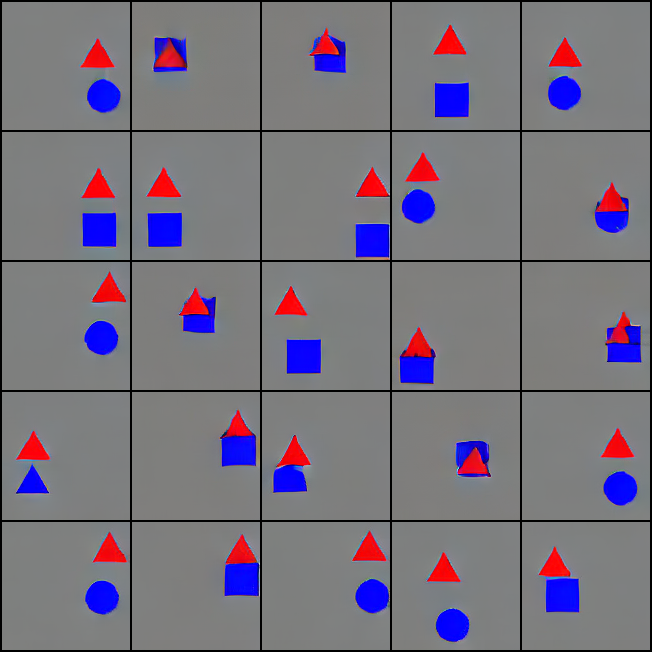

In [198]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "the the the the triangle red below ", return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

torch.Size([50, 20, 4096])
torch.Size([50, 20])


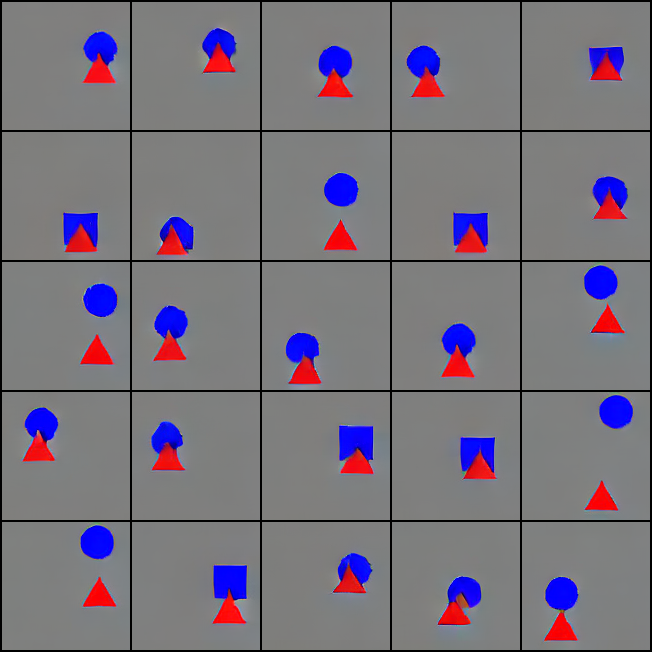

In [197]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "the the the the triangle red above ", return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

torch.Size([50, 20, 4096])
torch.Size([50, 20])


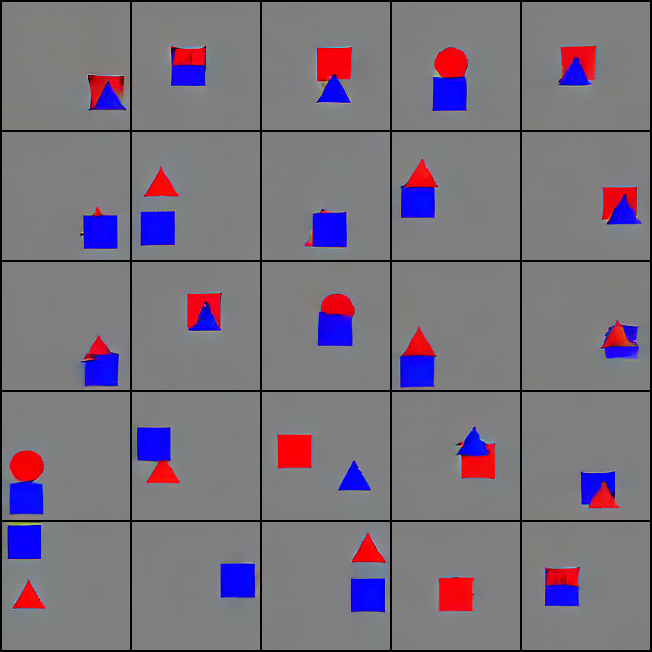

In [195]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "the the the triangle red square blue above ", return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

torch.Size([50, 20, 4096])
torch.Size([50, 20])


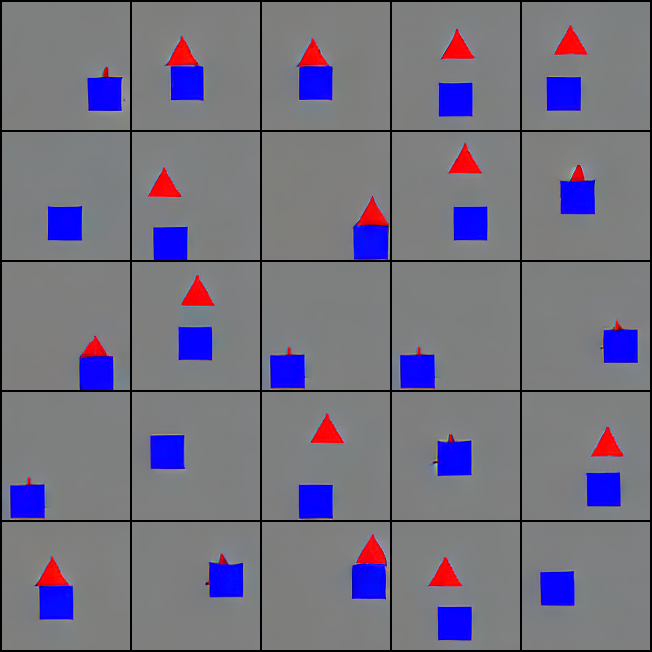

In [190]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "red triangle the the blue square above ", return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

torch.Size([50, 20, 4096])
torch.Size([50, 20])


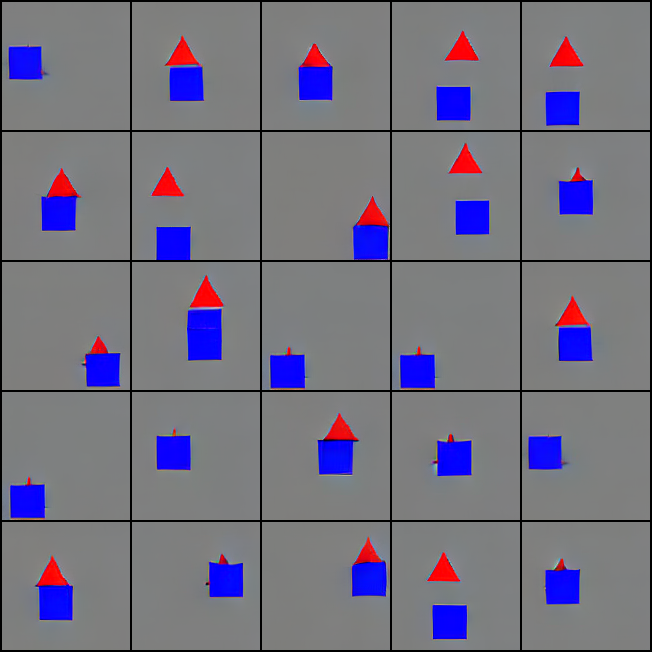

In [173]:
images_logs, _, _, _ = pipeline_inference_custom(pipeline, "above red triangle is blue square", return_sample_pred_traj=False, random_seed=0)
pil_images_to_grid(images_logs[0]['images'])

In [ ]:
images = []
for latent in latents:
    images.append(pipeline.vae.decode(latent.to(weight_dtype) / pipeline.vae.config.scaling_factor, return_dict=False)[0])

In [116]:
tokenize_embed_prompt("red square blue triangle", tokenizer, rndpos_encoder, max_length=20, device="cuda")

({'caption_embeds': tensor([[[-0.0609,  0.3837,  0.2152,  ...,  0.2301,  0.0813,  0.3842],
           [ 0.3661,  0.2643,  0.2454,  ...,  0.1502,  0.1104,  0.1653],
           [ 0.3774,  0.1049,  0.2577,  ...,  0.1502,  0.1104,  0.1653],
           ...,
           [ 0.0656,  0.1284, -0.0507,  ...,  0.1502,  0.1106,  0.1653],
           [ 0.1006,  0.2843, -0.0281,  ...,  0.1502,  0.1106,  0.1653],
           [ 0.2508,  0.3391,  0.1164,  ...,  0.1502,  0.1107,  0.1653]]],
         device='cuda:0'),
  'emb_mask': tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]],
         device='cuda:0'),
  'prompt': '',
  'token_ids': tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]],
         device='cuda:0')},
 {'caption_embeds': tensor([[[ 0.1041,  0.4146, -0.2654,  ...,  0.0858, -0.0207,  0.1217],
           [ 0.0526,  0.0232,  0.4155,  ...,  0.1324, -0.0274,  0.1598],
           [ 0.1298, -0.1163,  0.2091,  ...,  0.0530, -0.2467,  0.2743],
           ...,
    

### Low precsion overflow problem bfloat16

In [9]:
weight_dtype = torch.bfloat16
# Load the pretrained PixArt Alpha model from Hugging Face
model_name = "PixArt-alpha/PixArt-XL-2-512x512"
pipeline = PixArtAlphaPipeline_custom.from_pretrained(model_name,torch_dtype = weight_dtype)
pipeline = pipeline.to("cuda")

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

Some weights of the model checkpoint were not used when initializing PixArtTransformer2DModel: 
 ['caption_projection.y_embedding']


Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

In [10]:
tokenizer = pipeline.tokenizer

In [11]:
for layer in pipeline.transformer.transformer_blocks:
    layer.attn1.processor = AttnProcessor2_0_Store()
    layer.attn2.processor = AttnProcessor2_0_Store()
    layer.attn1.processor.store_attn_map = True
    layer.attn2.processor.store_attn_map = True

In [12]:
# pipeline.transformer = replace_attn_processor(pipeline.transformer)
attnvis_store = PixArtAttentionVisualizer_Store(pipeline)
attnvis_store.setup_hooks()

Setting up hooks for PixArt attention modules:
- Block 0
- Block 1
- Block 2
- Block 3
- Block 4
- Block 5
- Block 6
- Block 7
- Block 8
- Block 9
- Block 10
- Block 11
- Block 12
- Block 13
- Block 14
- Block 15
- Block 16
- Block 17
- Block 18
- Block 19
- Block 20
- Block 21
- Block 22
- Block 23
- Block 24
- Block 25
- Block 26
- Block 27


In [13]:
torch.cuda.empty_cache()

In [14]:
# Clear residual memory from previous runs (without affecting loaded model)
#torch.cuda.empty_cache()
#torch.cuda.ipc_collect()
#torch.cuda.synchronize()

attnvis_store.clear_activation()
image_logs, latents_traj, pred_traj, t_traj = visualize_prompts_with_traj(\
    pipeline, validation_prompts[5:6], num_inference_steps=20, guidance_scale=4.5, 
                                num_images_per_prompt=1, device=torch.device("cuda"), random_seed=1, weight_dtype=weight_dtype)
embed_infos = load_embed_and_mask(validation_prompts[5:6], prompt_cache_dir, config.model_max_length, device=torch.device("cuda"))

print(embed_infos[0]['prompt'])
prompt = embed_infos[0]['prompt']
# attention_mask_raw = embed_infos[0]['emb_mask'].cpu()
token_ids = tokenizer.encode(prompt)
word_tokens = tokenizer.convert_ids_to_tokens(token_ids)
word_tokens = [token.replace("▁", "") for token in word_tokens]

torch.Size([2, 120, 4096])
torch.Size([2, 120])
Function execution complete!
triangle is to the left of triangle


In [15]:
for timestep in range(len(latents_traj[0])):
    latents = latents_traj[0][timestep]
    report_tensor_stats(latents, f"Latents {timestep}")

Latents 0 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 1 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 2 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 3 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 4 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 5 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 6 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 7 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 8 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 9 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 10 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 11 | | Shape

In [16]:
# layer_i = 1 # note the 
for layer_i in range(24):
    timestep = -1
    self_attn_map = attnvis_store.activation[f'block{layer_i:02d}_self_attn_map'][timestep]
    cross_attn_map = attnvis_store.activation[f'block{layer_i:02d}_cross_attn_map'][timestep]
    report_tensor_stats(self_attn_map, f"Self-Attention Map {layer_i:02d} {timestep}")
    report_tensor_stats(cross_attn_map, f"Cross-Attention Map {layer_i:02d} {timestep}")

Self-Attention Map 00 -1 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross-Attention Map 00 -1 | | Shape: torch.Size([2, 16, 1024, 120]) | Non-NaN values: 3932160 | NaN values: 0 
Self-Attention Map 01 -1 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross-Attention Map 01 -1 | | Shape: torch.Size([2, 16, 1024, 120]) | Non-NaN values: 3932160 | NaN values: 0 
Self-Attention Map 02 -1 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross-Attention Map 02 -1 | | Shape: torch.Size([2, 16, 1024, 120]) | Non-NaN values: 3932160 | NaN values: 0 
Self-Attention Map 03 -1 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values: 0 
Cross-Attention Map 03 -1 | | Shape: torch.Size([2, 16, 1024, 120]) | Non-NaN values: 3932160 | NaN values: 0 
Self-Attention Map 04 -1 | | Shape: torch.Size([2, 16, 1024, 1024]) | Non-NaN values: 33554432 | NaN values:

### Low precsion overflow problem

In [10]:
weight_dtype = torch.float16
# Load the pretrained PixArt Alpha model from Hugging Face
model_name = "PixArt-alpha/PixArt-XL-2-512x512"
pipeline = PixArtAlphaPipeline_custom.from_pretrained(model_name,torch_dtype = weight_dtype)
pipeline = pipeline.to("cuda")

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

Some weights of the model checkpoint were not used when initializing PixArtTransformer2DModel: 
 ['caption_projection.y_embedding']


Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

In [21]:
tokenizer = pipeline.tokenizer

In [23]:
for layer in pipeline.transformer.transformer_blocks:
    layer.attn1.processor = AttnProcessor2_0_Store()
    layer.attn2.processor = AttnProcessor2_0_Store()
    layer.attn1.processor.store_attn_map = True
    layer.attn2.processor.store_attn_map = True

In [24]:
# pipeline.transformer = replace_attn_processor(pipeline.transformer)
attnvis_store = PixArtAttentionVisualizer_Store(pipeline)
attnvis_store.setup_hooks()

Setting up hooks for PixArt attention modules:
- Block 0
- Block 1
- Block 2
- Block 3
- Block 4
- Block 5
- Block 6
- Block 7
- Block 8
- Block 9
- Block 10
- Block 11
- Block 12
- Block 13
- Block 14
- Block 15
- Block 16
- Block 17
- Block 18
- Block 19
- Block 20
- Block 21
- Block 22
- Block 23
- Block 24
- Block 25
- Block 26
- Block 27


In [25]:
torch.cuda.empty_cache()

In [29]:
# Clear residual memory from previous runs (without affecting loaded model)
#torch.cuda.empty_cache()
#torch.cuda.ipc_collect()
#torch.cuda.synchronize()

attnvis_store.clear_activation()
image_logs, latents_traj, pred_traj, t_traj = visualize_prompts_with_traj(\
    pipeline, validation_prompts[5:6], num_inference_steps=20, guidance_scale=4.5, 
                                num_images_per_prompt=1, device=torch.device("cuda"), random_seed=1, weight_dtype=torch.float16)
embed_infos = load_embed_and_mask(validation_prompts[5:6], prompt_cache_dir, config.model_max_length, device=torch.device("cuda"))

print(embed_infos[0]['prompt'])
prompt = embed_infos[0]['prompt']
# attention_mask_raw = embed_infos[0]['emb_mask'].cpu()
token_ids = tokenizer.encode(prompt)
word_tokens = tokenizer.convert_ids_to_tokens(token_ids)
word_tokens = [token.replace("▁", "") for token in word_tokens]

torch.Size([2, 120, 4096])
torch.Size([2, 120])


: 

In [20]:
for timestep in range(len(latents_traj[0])):
    latents = latents_traj[0][timestep]
    report_tensor_stats(latents, f"Latents {timestep}")

Latents 0 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 16384 | NaN values: 0 
Latents 1 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 0 | NaN values: 16384 
Latents 2 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 0 | NaN values: 16384 
Latents 3 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 0 | NaN values: 16384 
Latents 4 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 0 | NaN values: 16384 
Latents 5 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 0 | NaN values: 16384 
Latents 6 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 0 | NaN values: 16384 
Latents 7 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 0 | NaN values: 16384 
Latents 8 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 0 | NaN values: 16384 
Latents 9 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 0 | NaN values: 16384 
Latents 10 | | Shape: torch.Size([1, 4, 64, 64]) | Non-NaN values: 0 | NaN values: 16384 
Latents 11 | | Shape